import required libraries

In [9]:
import matplotlib.pyplot as plt
import geopandas as gpd
import rasterio
from rasterio.plot import show
from skimage.feature import match_template
import numpy as np
from PIL import Image

open point shapefile

In [10]:
pointData = gpd.read_file('Shp/points.shp')
print('CRS of Point Data: ' + str(pointData.crs))

CRS of Point Data: epsg:32644


open raster file

In [11]:
bananaRaster = rasterio.open('Rst/Banana.tif')
print('CRS of Raster Data: ' + str(bananaRaster.crs))
print('Number of Raster Bands: ' + str(bananaRaster.count))
print('Interpretation of Raster Bands: ' + str(bananaRaster.colorinterp))

CRS of Raster Data: EPSG:32644
Number of Raster Bands: 4
Interpretation of Raster Bands: (<ColorInterp.red: 3>, <ColorInterp.green: 4>, <ColorInterp.blue: 5>, <ColorInterp.alpha: 6>)


show point and raster on a matplotlib plot

C:\ProgramData\Anaconda3\envs\geo-env\lib\site-packages\rasterio\plot.py:107: NodataShadowWarning: The dataset's nodata attribute is shadowing the alpha band. All masks will be determined by the nodata attribute
  arr = source.read(rgb_indexes, masked=True)


<AxesSubplot:>

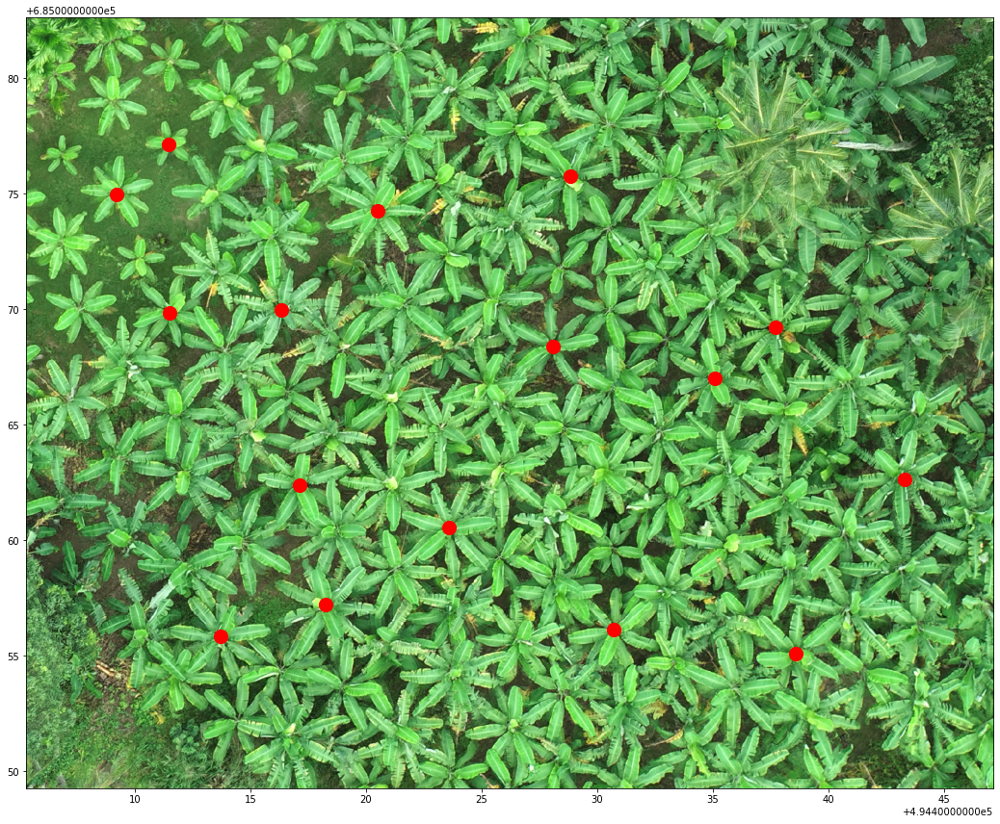

In [12]:
fig, ax = plt.subplots(figsize=(18,18))
pointData.plot(ax=ax, color='red', markersize=200)
show(bananaRaster, ax=ax)

selected band: green

In [13]:
greenBand = bananaRaster.read(2)

extract point value from raster

In [15]:
surveyRowCol = []
for index, values in pointData.iterrows():
    x = values['geometry'].xy[0][0]
    y = values['geometry'].xy[1][0]
    row, col = bananaRaster.index(x,y)
    print("Point N°:%d corresponds to row, col: %d, %d"%(index,row,col))
    surveyRowCol.append([row,col])

Point N°:0 corresponds to row, col: 383, 196
Point N°:1 corresponds to row, col: 639, 311
Point N°:2 corresponds to row, col: 782, 1489
Point N°:3 corresponds to row, col: 1340, 420
Point N°:4 corresponds to row, col: 419, 760
Point N°:5 corresponds to row, col: 712, 1139
Point N°:6 corresponds to row, col: 1013, 592
Point N°:7 corresponds to row, col: 1001, 1900
Point N°:8 corresponds to row, col: 1326, 1271
Point N°:9 corresponds to row, col: 345, 1177
Point N°:10 corresponds to row, col: 275, 307
Point N°:11 corresponds to row, col: 671, 1621
Point N°:12 corresponds to row, col: 1105, 915
Point N°:13 corresponds to row, col: 1271, 647
Point N°:14 corresponds to row, col: 634, 551
Point N°:15 corresponds to row, col: 1376, 1665


number of template images

In [16]:
print('Number of template images: %d'%len(surveyRowCol))
radio = 80

Number of template images: 16


show all the points of interest, please be careful to have a complete image, otherwise the model wont run

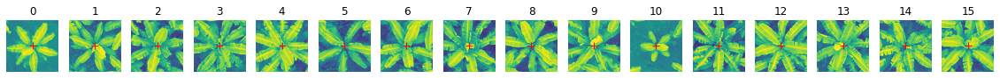

In [17]:
fig, ax = plt.subplots(1, len(surveyRowCol),figsize=(20,5))

for index, item in enumerate(surveyRowCol):
    row = item[0]
    col = item[1]
    ax[index].imshow(greenBand)
    ax[index].plot(col,row,color='red', linestyle='dashed', marker='+',
     markerfacecolor='blue', markersize=8)
    ax[index].set_xlim(col-radio,col+radio)
    ax[index].set_ylim(row-radio,row+radio)
    ax[index].axis('off')
    ax[index].set_title(index)

Match the image to the template

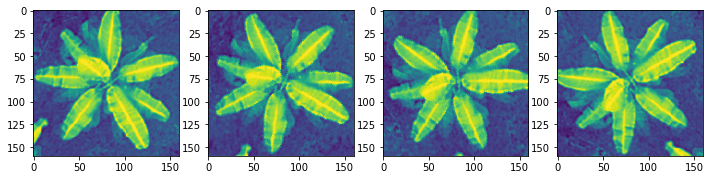

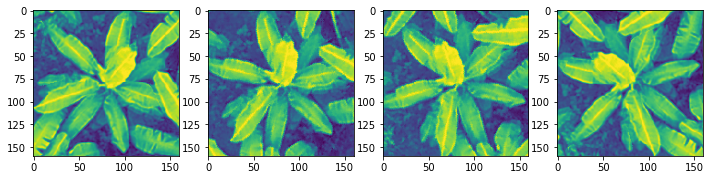

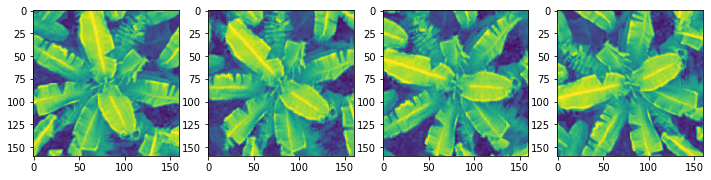

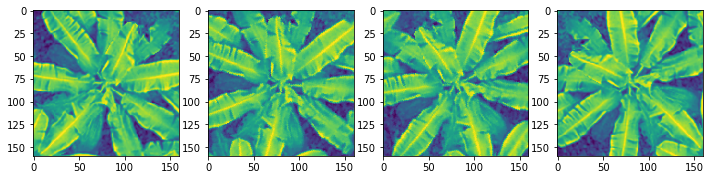

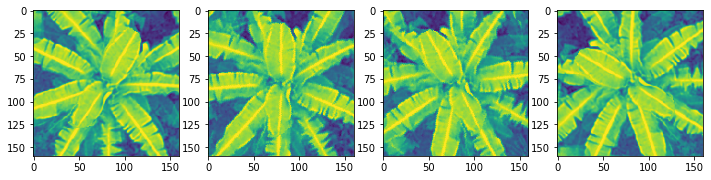

...

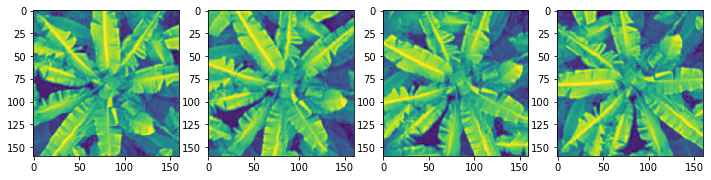

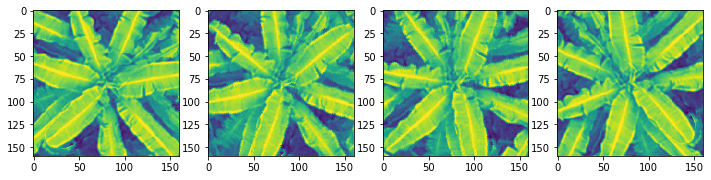

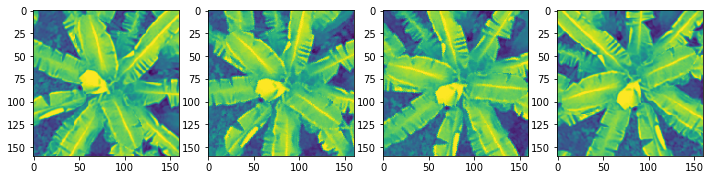

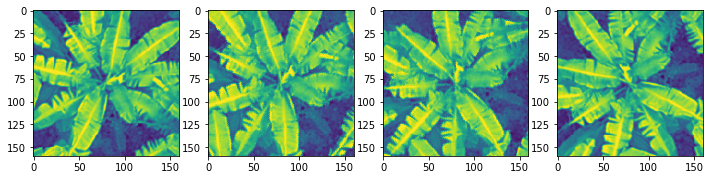

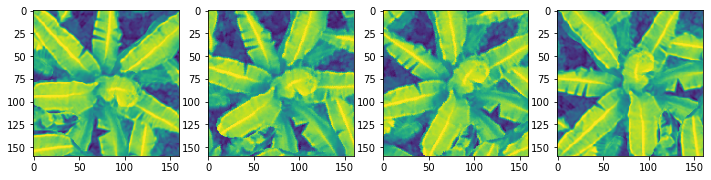

In [18]:
listaresultados = []

templateBandList = []
for rowCol in surveyRowCol:
    imageList = []
    row = rowCol[0]
    col = rowCol[1]
    #append original band
    imageList.append(greenBand[row-radio:row+radio, col-radio:col+radio])
    #append rotated images
    templateBandToRotate = greenBand[row-2*radio:row+2*radio, col-2*radio:col+2*radio]
    rotationList = [i*30 for i in range(1,4)]
    for rotation in rotationList:
        rotatedRaw = Image.fromarray(templateBandToRotate)
        rotatedImage = rotatedRaw.rotate(rotation)
        imageList.append(np.asarray(rotatedImage)[radio:-radio,radio:-radio])
    #plot original and rotated images
    fig, ax = plt.subplots(1, len(imageList),figsize=(12,12))
    for index, item in enumerate(imageList):
        ax[index].imshow(imageList[index])
    #add images to total list
    templateBandList+=imageList

match the template image to the orthophoto

In [20]:
matchXYList = []
for index, templateband in enumerate(templateBandList):
    if index%10 == 0:
        print('Match template ongoing for figure Nº %d'%index)
    matchTemplate = match_template(greenBand, templateband, pad_input=True)
    matchTemplateFiltered = np.where(matchTemplate>np.quantile(matchTemplate,0.9996))
    for item in zip(matchTemplateFiltered[0],matchTemplateFiltered[1]):
        x, y = bananaRaster.xy(item[0], item[1])
        matchXYList.append([x,y])

Match template ongoing for figure Nº 0
Match template ongoing for figure Nº 10
Match template ongoing for figure Nº 20
Match template ongoing for figure Nº 30
Match template ongoing for figure Nº 40
Match template ongoing for figure Nº 50
Match template ongoing for figure Nº 60


plot interpreted points over the image

<AxesSubplot:>

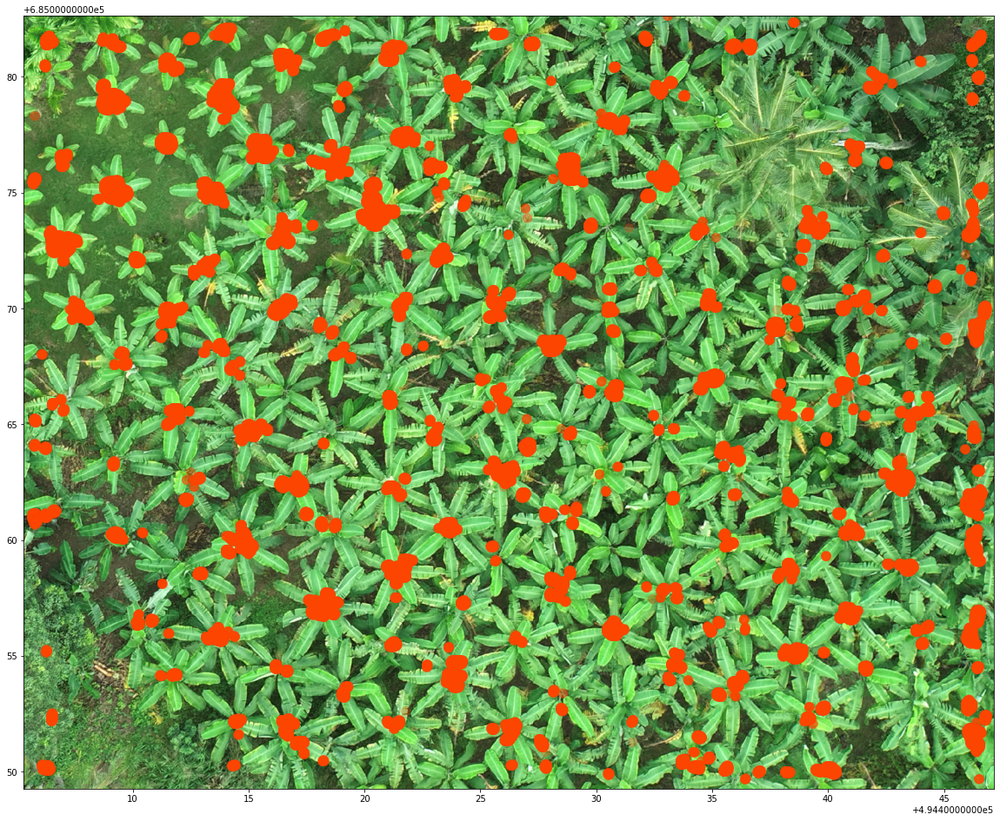

In [22]:
fig, ax = plt.subplots(figsize=(20, 20))
matchXYArray = np.array(matchXYList)
ax.scatter(matchXYArray[:,0],matchXYArray[:,1], marker='o',c='orangered', s=100, alpha=0.25)
show(bananaRaster, ax=ax)

cluster analysis

In [23]:
from sklearn.cluster import Birch
brc = Birch(branching_factor=10000, n_clusters=None, threshold=1, compute_labels=True)
brc.fit(matchXYArray)
birchPoint = brc.subcluster_centers_
birchPoint

array([[494406.42045878, 685081.42410794],
       [494442.1813318 , 685079.8137483 ],
       [494409.10230303, 685079.01363452],
       [494418.70646604, 685076.47872027],
       [494409.33015552, 685075.02129525],
       [494409.11072308, 685081.48413508],
       [494406.87855986, 685072.69724492],
       [494434.61855606, 685050.3260397 ],
       [494406.32073998, 685050.36766053],
       [494439.79514853, 685050.4181999 ],
       [494420.44940062, 685074.35697104],
       [494444.87312045, 685073.99046872],
       [494427.60239893, 685051.00769506],
       [494413.51022495, 685075.15880675],
       [494407.68890447, 685069.81345776],
       [494426.29684727, 685063.0906025 ],
       [494421.63476245, 685077.44159953],
       [494415.53869888, 685076.91403174],
       [494423.33681515, 685072.18735425],
       [494412.71172499, 685071.66197423],
       [494411.30123572, 685069.47690236],
       [494428.47926957, 685061.01358781],
       [494413.50225665, 685055.87751405],
       [494

plot clustered points

C:\ProgramData\Anaconda3\envs\geo-env\lib\site-packages\rasterio\plot.py:107: NodataShadowWarning: The dataset's nodata attribute is shadowing the alpha band. All masks will be determined by the nodata attribute
  arr = source.read(rgb_indexes, masked=True)


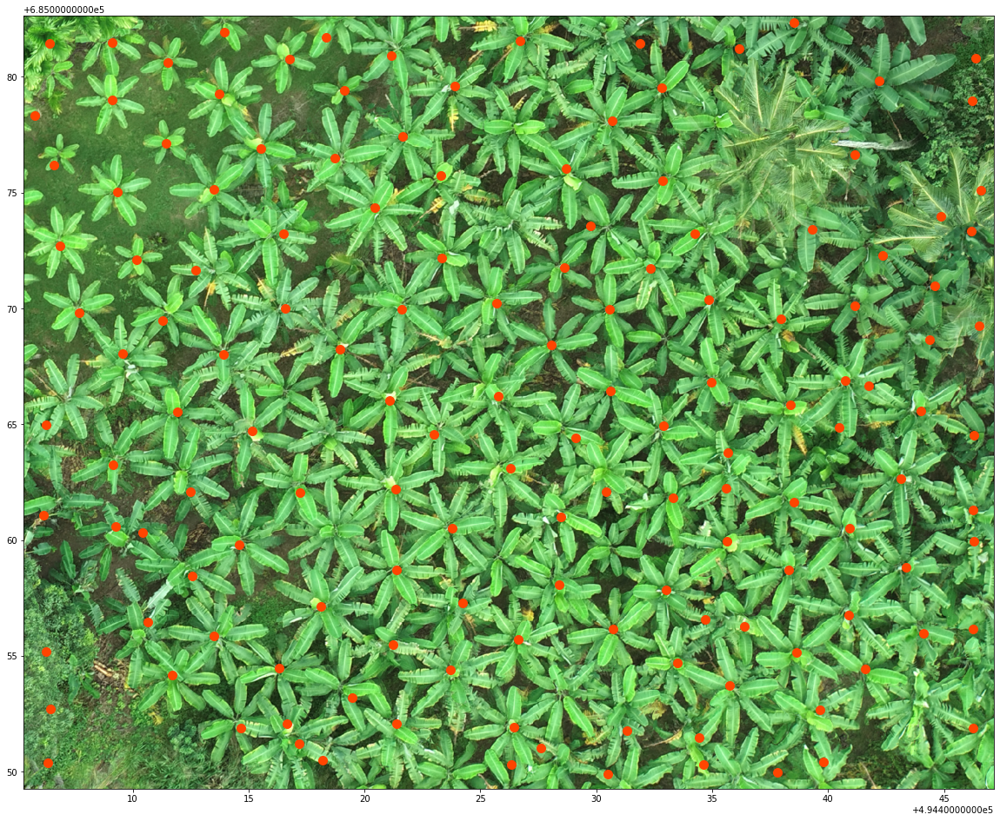

In [24]:
fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(111)
ax.scatter(birchPoint[:,[0]],birchPoint[:,[1]], marker='o',color='orangered',s=100)
show(bananaRaster, ax=ax)
plt.show()

save point data into csv

In [25]:
np.savetxt("Txt/result_banana_trees.csv", birchPoint, delimiter =",")